# Desarrollo Proyecto Final - Minería de Datos #

#### Juan Pablo Garzón Rivera - David Santiago Pérez Barrios - Yeferson Fabian Rubio Montero

## Procesamiento de Imágenes (Reconocimiento Facial) 

En este estudio, la detección de rostros se realizó a partir de las imágenes del conjunto de datos LFW. LFW es una base de datos compuesta por fotografías de rostros, diseñada para estudiar el problema del reconocimiento facial sin restricciones. Este conjunto de datos contiene más de 13.000 imágenes de rostros recopiladas de internet. Cada rostro ha sido etiquetado con el nombre de la persona en la foto. 1680 de las personas en la foto tienen dos o más fotos distintas en el conjunto de datos. 

Antes de la detección de rostros en imágenes LFW, la detección de rostros múltiples se realiza en imágenes individuales.

El número deseado de imágenes se toma del archivo zip en el conjunto de datos LFW. Luego, la detección de rostros se realizó a partir de estas imágenes.

In [1]:
import numpy as np # Algebra Lineal
import pandas as pd # Procesamiento de Datos p.e. archivos CSV

# Visualización
import matplotlib.pyplot as plt

# Procesamiento de Imágenes
import cv2

# Extracción de archivos comprimidos
import tarfile

# Sistema (Abrir direcciones)
import os
# print(os.listdir("D:/Proyecto_Mineria/Proyecto/Haarcascade/opencv-master/data/haarcascades"))
# print(os.listdir("D:/Proyecto_Mineria/Proyecto/lfw"))

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import metrics


In [2]:
# Ignorar warnings
import warnings
warnings.filterwarnings('ignore')
print("Warnings ignored!!")

Warnings ignored!!


### Creación de la clase para detección de rostro

In [3]:
# Creación de función para identificar las coordenadas del rostro dada una imágen #

class FaceDetector():

    def __init__(self,faceCascadePath):
        self.faceCascade=cv2.CascadeClassifier(faceCascadePath)


    def detect(self, image, scaleFactor=1.1,
               minNeighbors=5,
               minSize=(30,30)):
        
        # La función devuelve el rectangulo con las coordenadas en la cara para una imágen dada 
        rects=self.faceCascade.detectMultiScale(image,
                                                scaleFactor=scaleFactor,
                                                minNeighbors=minNeighbors,
                                                minSize=minSize)
        return rects

Un archivo con la extensión .xml consiste en un archivo de lenguaje marcado extensible (XML), el cual consiste en un archivo de texto sin formato que utiliza una serie de etiquetas personalizadas con la finalidad de describir tanto la estructura como otras características del documento. [Fuente](https://www.muyinteresante.es/tecnologia/articulo/que-es-y-como-abrir-un-archivo-xml-201608322902)

In [4]:
# Se carga archivo: "Frontal face of haar cascade"
frontal_cascade_path="D:/Proyecto_Mineria/Proyecto/Haarcascade/opencv-master/data/haarcascades/haarcascade_frontalface_alt.xml" # Modelo de detección

# Se crea el objeto que permite detectar el rostro
fd=FaceDetector(frontal_cascade_path)

In [5]:
# Cargamos un ejemplos con imágen que contiene rostros
Trabajo = cv2.imread("D:/Proyecto_Mineria/Proyecto/Extras/Imagenes/group1.jpg")
Ben = cv2.imread("D:/Proyecto_Mineria/Proyecto/Extras/Imagenes/Ben.jpg")

## Detección de rostros en Imagenes tomadas 

In [48]:
# Creamos un objeto que nos imprima una copia de la imágen utilziada para que no se vea afectada a los cambios 
def Trabajadores():
    return np.copy(Trabajo)

def Celebridad():
    return np.copy(Ben)

# Definimos la forma en la que se mostrarán las imágenes al imprimirlas

def show_image(image):
    plt.figure(figsize=(15,16))
    # Antes de mostrar la imágen, se cambia el orden del color de BGR a RGB
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.xticks([])
    plt.yticks([])
    plt.show()
    
# Se plantea la función para reconocimiento de rostros, usando "haarcascade" de OpenCV
def face_detection(img):
    face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_alt.xml')
    
    # En caso de que se tenga un rostro en una imágen en escala de grises
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    print('Number of faces detected:', len(faces))
        
    for (x,y,w,h) in faces:
        cv2.rectangle(img,(x,y),(x+w,y+h),(220, 186,0),2) # Parámetros del rectángulo
        # img = img[y:y+h, x:x+w] # for cropping
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return cv_rgb

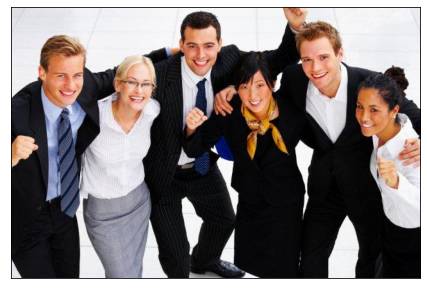

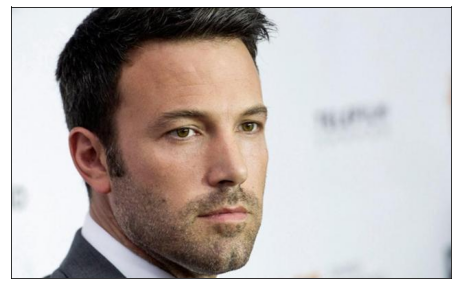

In [7]:
# Mostramos las imágenes seleccionadas
show_image(Trabajadores())
show_image(Celebridad())

Number of faces detected: 6


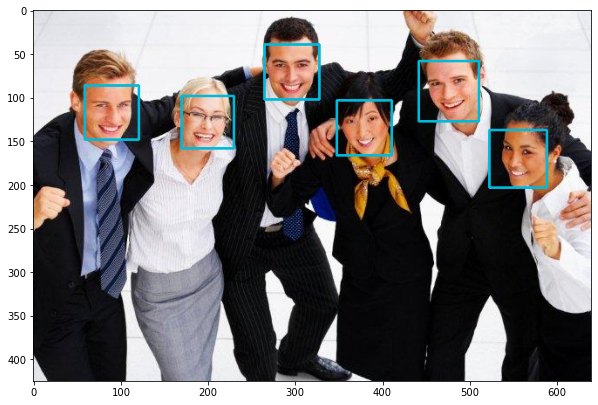

Number of faces detected: 1


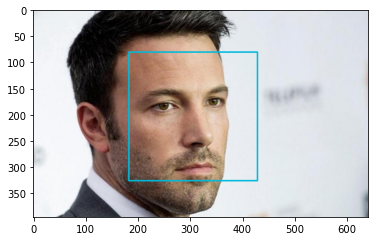

In [8]:
plt.figure(figsize=(10,11)) # agrandamos un poco la imágen para observar mejor
Trabajadores_RF = face_detection(Trabajadores())
plt.imshow(Trabajadores_RF)
plt.show() 

Ben_RF = face_detection(Celebridad())
plt.imshow(Ben_RF)
plt.show() 

El modelo de detección propuesto en el archivo de "Haarcascade" tiene una desventaja y es que en algunas ocasiones no es posible detectar imágenes de caras no frontales lo que dificulta el reconocimiento, además de que en algunas ocasiones, la caja en donde se enmarca el rostro del individuo, no incluye la cara completa, muestra la barbilla recortada o la frente. A partir de ello, verifiquemos nuevamente mediante el uso de un nuevo modelo.

In [9]:
# Cargamos el nuevo modelo a utilizar
Archivo_Modelo ="res10_300x300_ssd_iter_140000_fp16.caffemodel"
Archivo_Config = "deploy.prototxt"
net = cv2.dnn.readNetFromCaffe(Archivo_Config, Archivo_Modelo)

In [10]:
# Creación de la función para extraer las dimensiones del recuadro en imágenes que contienen una sola cara o para identificar un único rostro
def unica_cara(img, coord=False):
    blob = cv2.dnn.blobFromImage(img, 1, (224,224), [104, 117, 123], False, False) 
    
    # Parámetros: Fuente; escala = 1 ; tamaño = 300,300 ; media de valores RGB = (r,g,b) ; cambio RGB = falso ; recortar = falso
    
    conf_threshold = 0.8 # Nivel de confianza de al menos un 60%
    frameWidth = img.shape[1] # Obtener el ancho de la imagen
    frameHeight = img.shape[0] # Obtener la altura de la imagen
    max_confidence = 0
    net.setInput(blob)
    detections = net.forward()
    detection_index = 0
    bboxes = []
    
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:
            
            if max_confidence < confidence: # Solo muestra la máxima confianza en la cara
                max_confidence = confidence
                detection_index = i
    i=detection_index        
    x1 = int(detections[0, 0, i, 3] * frameWidth)
    y1 = int(detections[0, 0, i, 4] * frameHeight)
    x2 = int(detections[0, 0, i, 5] * frameWidth)
    y2 = int(detections[0, 0, i, 6] * frameHeight)
    cv2.rectangle(img,(x1,y1),(x2,y2),(255,150,0),2) # Colores del recuadro
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if coord==True:
        return x1, y1, x2, y2
    return cv_rgb

In [11]:
# Múltiples caras necesitan aumentar el tamaño de la imagen, así como las múltiples detecciones (Detección de varias caras en imágen de grupo de personas)
def multiples_caras(img):
    blob = cv2.dnn.blobFromImage(img, 1.2, (1200,1200), [104, 117, 123], False, False) #
    # params: source, scale=1, size=300,300, mean RGB values (r,g,b), rgb swapping=false, crop = false
    conf_threshold=0.6 # confidence at least 60%
    frameWidth=img.shape[1] # get image width
    frameHeight=img.shape[0] # get image height
    net.setInput(blob)
    detections = net.forward()
  
    bboxes = []
    
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > conf_threshold:
                  
            x1 = int(detections[0, 0, i, 3] * frameWidth)
            y1 = int(detections[0, 0, i, 4] * frameHeight)
            x2 = int(detections[0, 0, i, 5] * frameWidth)
            y2 = int(detections[0, 0, i, 6] * frameHeight)
            cv2.rectangle(img,(x1,y1),(x2,y2),(255,150,0),2)
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return cv_rgb

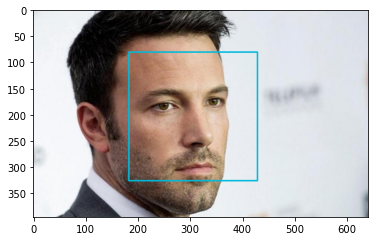

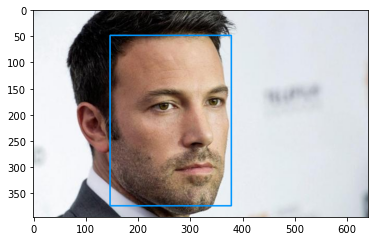

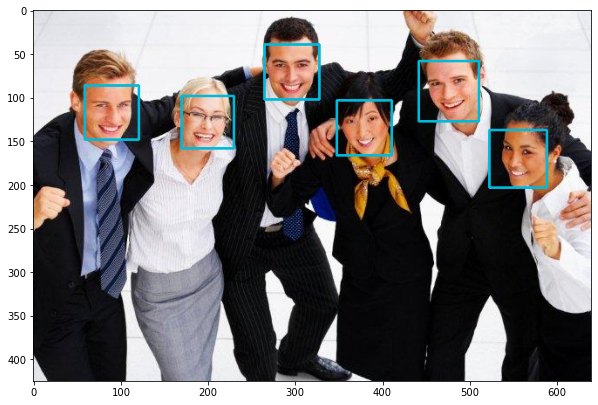

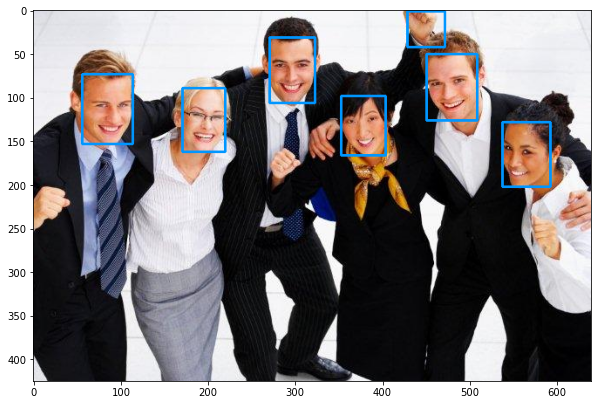

In [12]:
# Caso de la función para reconocimiento de una única cara
Ben_Cor = unica_cara(Celebridad()) # Correción del encuadre en el rostro
plt.imshow(Ben_RF) # Antes de la correción
plt.show() 
plt.imshow(Ben_Cor) # Después de la correción
plt.show() 

# Caso de la función para reconocimiento de varias caras
plt.figure(figsize=(10,11))
Trabajadores_Cor = multiples_caras(Trabajadores()) # Correción del encuadre en el rostro
plt.imshow(Trabajadores_RF) # Antes de la correción
plt.show() 
plt.figure(figsize=(10,11))
plt.imshow(Trabajadores_Cor) # Después de la correción
plt.show() 

Existen algunas excepciones en que la función "múltiples caras" no registra algunas caras o por el contrario, incluye objetos que no deberían ser considerados, tal y como lo muestra el último resultado. Sin embargo, la función de "unica cara", puede detectar caras frontales y no frontales sin hacer recortes en los razgos del rostro.

### Extracción de la base LFW para detección de rostros

In [13]:
fname='D:/Proyecto_Mineria/Proyecto/Funneled/lfw-funneled.tgz'

In [14]:
def jpg_files(members): #only extract jpg files
    for tarinfo in members:
        if os.path.splitext(tarinfo.name)[1] == ".jpg":
            yield tarinfo
            
def untar(fname,path): #untarring the archive
    tar = tarfile.open(fname)
    tar.extractall(path,members=jpg_files(tar))
    tar.close()
    if path is "":
        print("File Extracted in Current Directory")
    else:
        print("File Extracted in to",  path)

In [15]:
path = 'D:/Proyecto_Mineria/Proyecto/Funneled/LFW'
untar(fname,path) # Dirección entorno python

File Extracted in to D:/Proyecto_Mineria/Proyecto/Funneled/LFW


In [16]:
len(os.listdir('D:/Proyecto_Mineria/Proyecto/Funneled/LFW/lfw_funneled/')) # total number of folders (people)

5749

In [17]:
total = sum([len(files) for r, d, files in os.walk('D:/Proyecto_Mineria/Proyecto/Funneled/LFW/lfw_funneled/')])
print(total)

13233


In [18]:
count=0 
imglist=[]
# 
for r, d, files in os.walk('D:/Proyecto_Mineria/Proyecto/Funneled/LFW/lfw_funneled/'):   
    if len(files)>=20: 
        imglist.append(r)
        #print(count, r)
        count+=1 # counts how many folders have with at least 20 images
print(count)

62


In [19]:
#os.listdir(imglist[0])
# pick one random photo
a=np.random.randint(0,20)
b=np.random.randint(0,62)
imglist[b]

'D:/Proyecto_Mineria/Proyecto/Funneled/LFW/lfw_funneled/Laura_Bush'

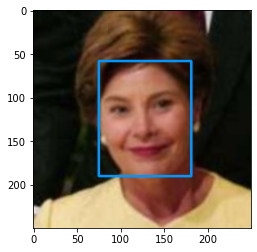

In [20]:
# show the random photo with face detected
img=imglist[b]+'/'+os.listdir(imglist[b])[a]
img=cv2.imread(img)
c=unica_cara(img)
plt.imshow(c)
plt.show()

In [22]:
#remove unused folders
import shutil
pathd='D:/Proyecto_Mineria/Proyecto/Funneled/LFW/lfw_funneled/'

#shutil.rmtree(os.path.realpath('LFW'))
for dirs in os.listdir(pathd):
    if not (pathd+dirs) in imglist:
        shutil.rmtree(os.path.realpath(path+dirs))

FileNotFoundError: [WinError 3] El sistema no puede encontrar la ruta especificada: 'D:\\Proyecto_Mineria\\Proyecto\\Funneled\\LFWAaron_Eckhart'

In [23]:
dirs=os.listdir(pathd)
dirs.sort()

In [50]:
#example of box coordinates
#a=np.random.randint(0,20)
b=np.random.randint(0,62)
for img in os.listdir(pathd+dirs[b])[:5]:
    #print(pathd+dirs[0]+'/'+img)
    print(dirs[b])
    img=cv2.imread(pathd+dirs[b]+'/'+img)
    x1, y1, x2, y2=unica_cara(img, True)
    #print coordinates of the detected face
    print(x1, y1, x2, y2)
    plt.imshow(img)
    plt.show()

IndexError: string index out of range

In [25]:
os.listdir('D:/Proyecto_Mineria/Proyecto/Funneled/LFW/')
pathd
#(os.listdir(pathd))

'D:/Proyecto_Mineria/Proyecto/Funneled/LFW/lfw_funneled/'

In [26]:
# # creating test and train set
from numpy import random
datadir='D:/Proyecto_Mineria/Proyecto/Funneled/LFW/'
train=datadir+'train/'
test=datadir+'test/'

if not os.path.exists(train):
    os.mkdir(train)
if not os.path.exists(test):
    os.mkdir(test)
    
for dirs in os.listdir(pathd):
    filenames = os.listdir(pathd+dirs)
    filenames.sort()  # make sure that the filenames have a fixed order before shuffling
    random.seed(402)
    random.shuffle(filenames) # shuffles the ordering of filenames (deterministic given the chosen seed)
    split = int(0.85 * len(filenames))
    train_filenames = filenames[:split] # splitting filenames into two parts
    test_filenames = filenames[split:]
    for img in train_filenames:
        full_file_name = os.path.join(pathd+dirs, img)
        cur_dir=os.path.join(train+dirs)
        #print(cur_dir)
        if not os.path.exists(cur_dir): # create this current person's folder for training
            os.mkdir(cur_dir)
        shutil.copy(full_file_name, cur_dir)
    for img in test_filenames:
        full_file_name = os.path.join(pathd+dirs, img)
        cur_dir=os.path.join(test+dirs)
        if not os.path.exists(cur_dir): # create this current person's folder for testing
            os.mkdir(cur_dir)
        shutil.copy(full_file_name, cur_dir)
        #a=full_file_name+' '+test+dirs
shutil.rmtree('D:/Proyecto_Mineria/Proyecto/Funneled/lfw_funneled/')

FileNotFoundError: [WinError 3] El sistema no puede encontrar la ruta especificada: 'D:/Proyecto_Mineria/Proyecto/Funneled/lfw_funneled/'

In [27]:
# total number of images left
total = sum([len(files) for r, d, files in os.walk(datadir)])
print(total)

26466


In [28]:
labeldir="Labels/" # labels dir
wdir="D:/Proyecto_Mineria/Proyecto/Funneled/LFW/"
lab=wdir+labeldir
if not os.path.exists(lab):
    os.mkdir(lab)

In [29]:
#  function for creating box labels as txt file
def label_txt(pathdr, lab_dir):
    for fol in os.listdir(pathdr):
        tfile = open(lab_dir+fol+".txt","w+")
        for img in os.listdir(pathdr+fol):
            pathimg=os.path.join(pathdr+fol, img)
            #print(pathimg)
            pic=cv2.imread(pathimg)
            x1, y1, x2, y2=unica_cara(pic, True) # face detection and then saving into txt file       
            tfile.write(img+' '+str(x1)+' '+str(x2)+' '+str(y1)+' '+str(y2)+'\n')          
        tfile.close()
    print('Saved')

In [30]:
lab_dir=lab+'train/'
os.mkdir(lab_dir)
label_txt(train, lab_dir)

lab_dir=lab+'test/'
os.mkdir(lab_dir)
label_txt(test, lab_dir)

Saved
Saved


In [33]:
#let's check if txt files are correct:
f2 = open("D:/Proyecto_Mineria/Proyecto/Funneled/LFW/Labels/test/Arnold_Schwarzenegger.txt","r")
print(f2.read())
f2.close()

Arnold_Schwarzenegger_0006.jpg 80 172 61 190
Arnold_Schwarzenegger_0007.jpg 76 177 59 199
Arnold_Schwarzenegger_0011.jpg 79 169 62 194
Arnold_Schwarzenegger_0016.jpg 77 176 57 196
Arnold_Schwarzenegger_0031.jpg 80 174 60 189
Arnold_Schwarzenegger_0036.jpg 73 174 61 202
Arnold_Schwarzenegger_0041.jpg 77 176 60 195



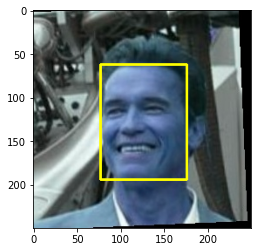

In [37]:
# checking Arnold_Schwarzenegger_0041.jpg
pic=cv2.imread(test+'Arnold_Schwarzenegger/Arnold_Schwarzenegger_0041.jpg')
cv2.rectangle(pic,(77 ,62),(176,194),(255,255,0),2)
plt.imshow(pic)
plt.show()

## Creación de la clase para la base de datos LFW

In [38]:
class FetchLFW:
    def __init__(self, path):
        self.path=path
        
    # Se define la dimensión que tendrá la matriz con las imágenes # 
        
    def _initialize(self,dim):
        self.Dimension_Galeria=dim
        self.Numero_Imagenes=self.Dimension_Galeria*self.Dimension_Galeria
        
        Total_No_Imagenes=13233 # Cantidad de imágenes en la BD 
        self.Eleccion_Rostros_Aleatorios=np.arange(Total_No_Imagenes)
        np.random.shuffle(self.Eleccion_Rostros_Aleatorios)
        self.n_random_face_indexes=self.Eleccion_Rostros_Aleatorios[:self.Numero_Imagenes]
        
    def get_lfw_images(self,dim=5):
        
        self._initialize(dim)
        
        self.lfw_images=self._get_images()
        
        return self.lfw_images
        
    
    def _get_images(self):
        image_list=[]
        tar = tarfile.open(path, "r:gz")
        counter=0
        for tarinfo in tar:
            
            tar.extract(tarinfo.name)
            if tarinfo.name[-4:]==".jpg":
                if counter in self.n_random_face_indexes:
                    image=cv2.imread(tarinfo.name, cv2.IMREAD_COLOR)
                    image=cv2.resize(image,None,fx=0.4, fy=0.4, interpolation=cv2.INTER_AREA)
                    image_list.append(np.array(image))
                counter+=1
            if tarinfo.isdir():
                pass
            else:
                os.remove(tarinfo.name)
        tar.close()
        
        return np.array(image_list)

In [39]:
# Se carga la ruta donde se encuentra la base de datos en archivo comprimido #
path="D:/Proyecto_Mineria/Proyecto/Funneled/lfw-funneled.tgz"
fetchLFW=FetchLFW(path)

# Se establece la dimensión que tendrá la matriz #
dimension=15

# Se obtienen las imagenes de LFW #
images=fetchLFW.get_lfw_images(dim=dimension)
print("Las imágenes de LFW han sido obtenidas")

Las imágenes de LFW han sido obtenidas


In [40]:
#Imprimimos la forma como estará distribuida la matriz a usar #
print(images.shape)

(225, 100, 100, 3)


## Función para generar la galeria de imágenes

In [41]:
# Realizamos la creación de la matriz de imágenes correspondiente a las obtenidas según la dimensión establecida #
def get_photo_gallery():
    counter=0
    himages=[]
    vimages=[]
    for i in range(dimension):
        for j in range(dimension):
            
            himages.append(images[counter])
            counter+=1

        himage=np.hstack((himages))
        vimages.append(himage)
        himages=[]
    image_matrix=np.vstack((vimages))
    return image_matrix

## Galeria de Fotos

A partir de las imágenes que escogió la función de manera aleatoria y según la dimensión establecida, generamos una matriz con todas estas imágenes, de tal manera que parece una galeria de fotos.

photo_gallery:(1500, 1500, 3)


<Figure size 1080x1152 with 0 Axes>

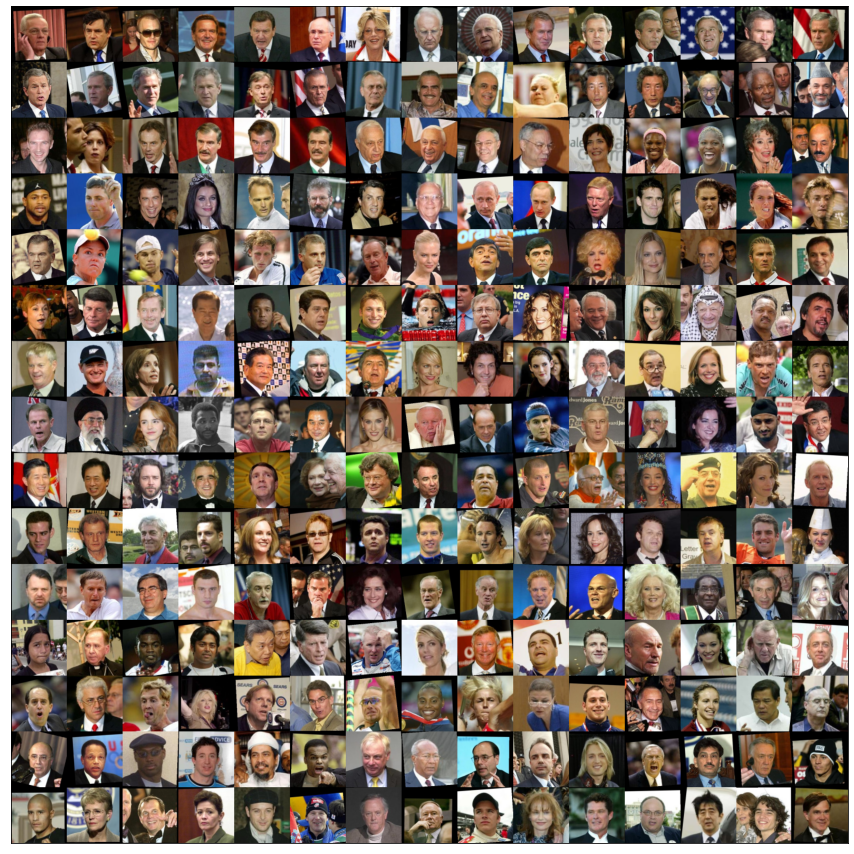

In [51]:
#Establecemos la galeria de fotos en forma de matriz #
plt.figure(figsize=(15,16))
photo_gallery=get_photo_gallery()
print("photo_gallery:{}".format(photo_gallery.shape))
show_image(photo_gallery)

In [65]:
#Establecemos la galeria de fotos en forma de matriz #
plt.figure(figsize=(15,16))
photo_gallery=get_photo_gallery()
print("photo_gallery:{}".format(photo_gallery.shape))

def Galeria():
    return np.copy(photo_gallery)

photo_gallery:(1500, 1500, 3)


<Figure size 1080x1152 with 0 Axes>

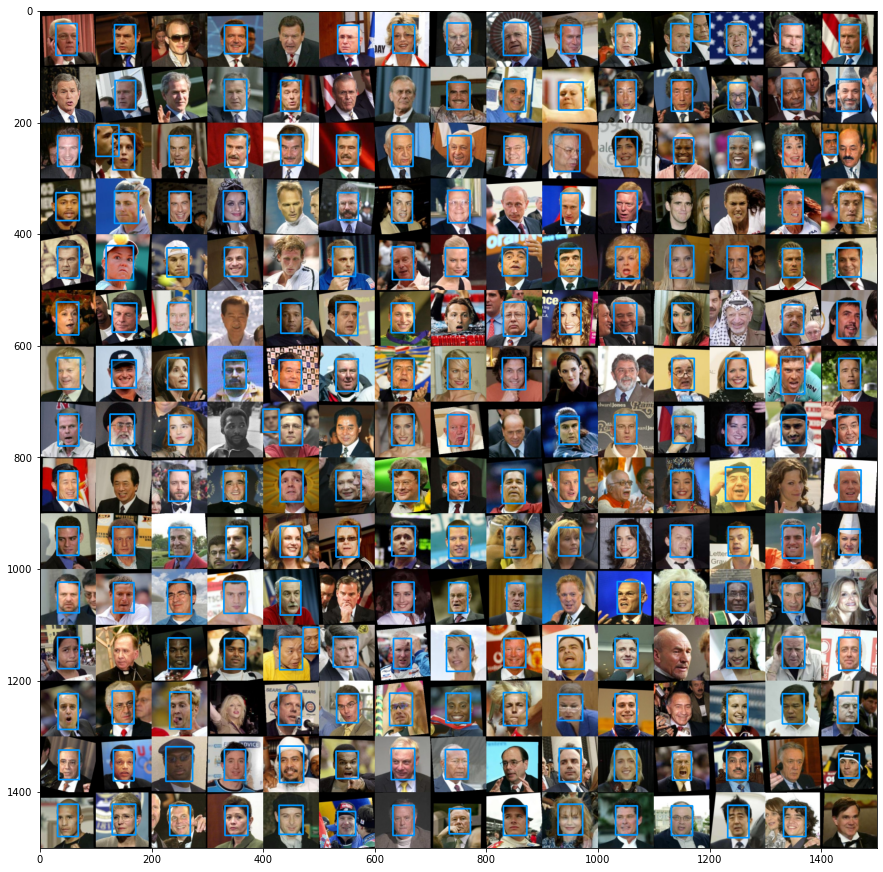

In [66]:
plt.figure(figsize=(15,16))
c=multiples_caras(Galeria())
plt.imshow(c)
plt.show()


## Detectar rostros en la base de datos

In [57]:
# Cargamos el nuevo modelo a utilizar
Archivo_Modelo ="res10_300x300_ssd_iter_140000_fp16.caffemodel"
Archivo_Config = "deploy.prototxt"
net = cv2.dnn.readNetFromCaffe(Archivo_Config, Archivo_Modelo)

# Cargamos el código que permite la detección de rostros #
# frontal_cascade_path="D:/Proyecto_Mineria/Proyecto/Haarcascade/opencv-master/data/haarcascades/haarcascade_frontalface_alt.xml"
# fd=FaceDetector(net) # Detector de rostros

# Empezamos en un total de 0 rostros escaneados y registrados #
face_counter=0

for image_org in images:
    
    # La función busca y analiza la galeria de fotos en busca de rostros definidos que pueda seleccionar #
    
    image_gray=cv2.cvtColor(image_org,cv2.COLOR_BGR2GRAY)
    #faceRect=fd.detect(image_gray,
                       #scaleFactor=1.1,
                       #minNeighbors=5,
                       #minSize=(30,30))
                
    faceRect = multiples_caras(image_gray)
    
    # Se establece que si el algoritmo encuentra un rostro el cual este considere que está bien definido #
    # esta función encerrará dicha imágen en un recuadro, determinando el areá que comprende el rostro #
    
    first_detection=False
    for (x,y,w,h) in faceRect:
        if first_detection==False:
            face_counter+=1
            cv2.rectangle(image_org,(x,y),(x+w,y+h),(127,255,0),2)
            first_detection=True
        else:
            print("Second detection ignored in a image")
            
# Mostramos el total de imágenes que fueron escaneadas y el total que fueron reconocidas como rostros definidos #

print("{} images have been scaned".format(dimension*dimension))
print("{} faces have been detected".format(face_counter))

error: OpenCV(4.5.1) C:\Users\appveyor\AppData\Local\Temp\1\pip-req-build-1drr4hl0\opencv\modules\dnn\src\layers\convolution_layer.cpp:380: error: (-2:Unspecified error) Number of input channels should be multiple of 3 but got 1 in function 'cv::dnn::ConvolutionLayerImpl::getMemoryShapes'


## Mostramos la detección de rostros en formato de galeria

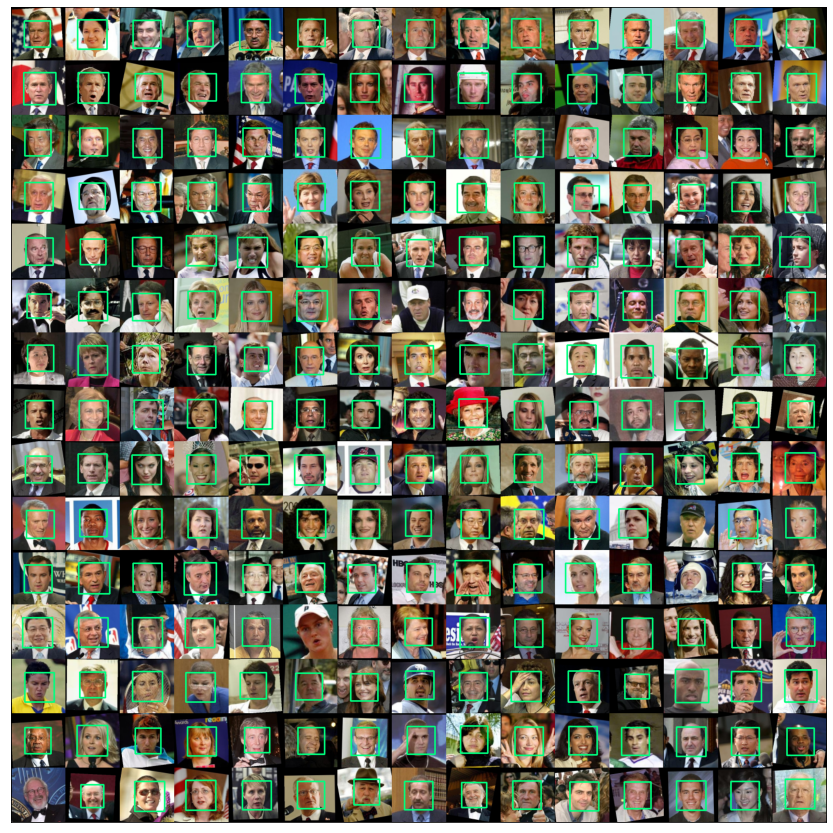

In [20]:
# Finalmente, se muestra la galeria de fotos con el encuadre de aquellas imágenes que el algoritmo reconoció e identificó claramente el rostro de la persona #
photo_gallery=get_photo_gallery()
show_image(photo_gallery)

Cabe aclarar que el algoritmo no considera aquellas imágenes en las cuales no se logre evidenciar en un gran porcentaje, los rasgos de la cara. No tiene en cuenta, aquellas imágenes que están obstruidas por objetos, sombras o elementos que perturben la correcta observación por parte del algoritmo. Así mismo, no considera aquellas imágenes que están de perfil o que está ocultando parte de su rostro. 

Por último, entre mayor sea la dimensión establecida por el usuario, habrá mayor cantidad de imágenes en la galeria de fotos y por lo tanto, el usuario no podrá apreciar en su totalidad la cantidad de imágenes encontradas.

In [64]:
class lfwPeopleDataset():
    
    def __init__(self, min_faces_per_person):
        self.faces = images(min_faces_per_person=min_faces_per_person)
    
    def draw_sample(self):
        fig, ax = plt.subplots(3, 5)
        for i, axi in enumerate(ax.flat):
            axi.imshow(self.faces.images[i], cmap='bone')
            axi.set(xticks=[], yticks=[],
            xlabel=self.faces.target_names[self.faces.target[i]])
            
    def get_features_labels(self):
        return self.faces.data, self.faces.target, self.faces.target_names

In [65]:
lfw_ds = lfwPeopleDataset(60)
lfw_ds.draw_sample()

TypeError: 'numpy.ndarray' object is not callable

In [31]:
# Se carga la ruta donde se encuentra la base de datos en archivo comprimido #
path="D:/Proyecto_Mineria/Proyecto/Funneled/lfw-funneled.tgz"
fetchLFW=FetchLFW(path)

# Se establece la dimensión que tendrá la matriz #
dimension=10

# Se obtienen las imagenes de LFW #
images=fetchLFW.get_lfw_images(dim=dimension)
print("Las imágenes de LFW han sido obtenidas")

Las imágenes de LFW han sido obtenidas


photo_gallery:(1000, 1000, 3)


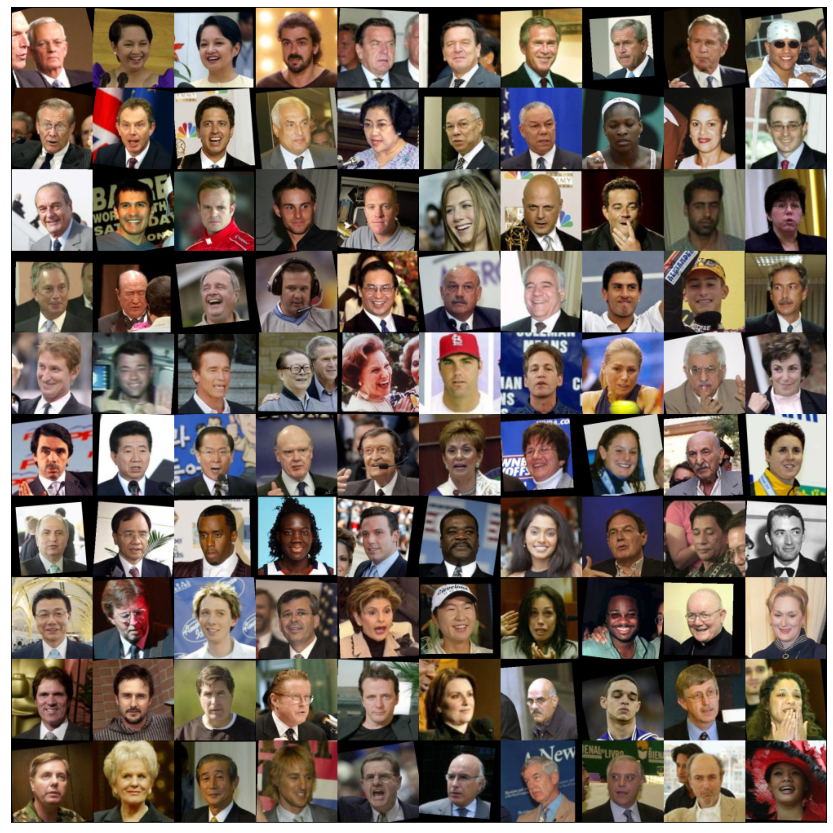

In [32]:
#Establecemos la galeria de fotos en forma de matriz #
photo_gallery=get_photo_gallery()
print("photo_gallery:{}".format(photo_gallery.shape))
show_image(photo_gallery)

In [40]:
#We reshape images for machine learnig  model
X=images.reshape((images.shape[0],images.shape[1]*images.shape[2]))
print("X shape:",X.shape)

ValueError: cannot reshape array of size 3000000 into shape (100,10000)

In [37]:
X_train, X_test, y_train, y_test=train_test_split(X, test_size=0.3, stratify=target, random_state=0)
print("X_train shape:",X_train.shape)
print("y_train shape:{}".format(y_train.shape))

ValueError: Found input variables with inconsistent numbers of samples: [1000, 400]

## Reconocimiento Facial con Olivetti
Los pasos para desarrollar el reconocimiento facial son los siguientes:
* Los componentes principales de las imágenes faciales fueron obtenidos mediante ACP (Análisis en Componentes Principales).
* Se determinó el número adecuado de componentes principales a utilizar.
* A partir de tres modelos de clasificación diferentes, se obtiene la puntuación de precisión.
* De acuerdo con tres modelos de clasificación diferentes, se obtuvo una puntuación de precisión de validación cruzada.
* Se realiza la optimización de parámetros partiendo del mejor modelo.

In [23]:
# Se carga la ruta donde se encuentra la base de datos en archivo comprimido #
data=np.load("olivetti_faces.npy")
target=np.load("olivetti_faces_target.npy")

print("There are {} images in the dataset".format(len(data)))
print("There are {} unique targets in the dataset".format(len(np.unique(target))))
print("Size of each image is {}x{}".format(data.shape[1],data.shape[2]))
print("Pixel values were scaled to [0,1] interval. e.g:{}".format(data[0][0,:4]))

print("unique target number:",np.unique(target))

There are 400 images in the dataset
There are 40 unique targets in the dataset
Size of each image is 64x64
Pixel values were scaled to [0,1] interval. e.g:[0.30991736 0.3677686  0.41735536 0.44214877]
unique target number: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]


Mostrar 40 personas distintas provenientes del conjunto de datos

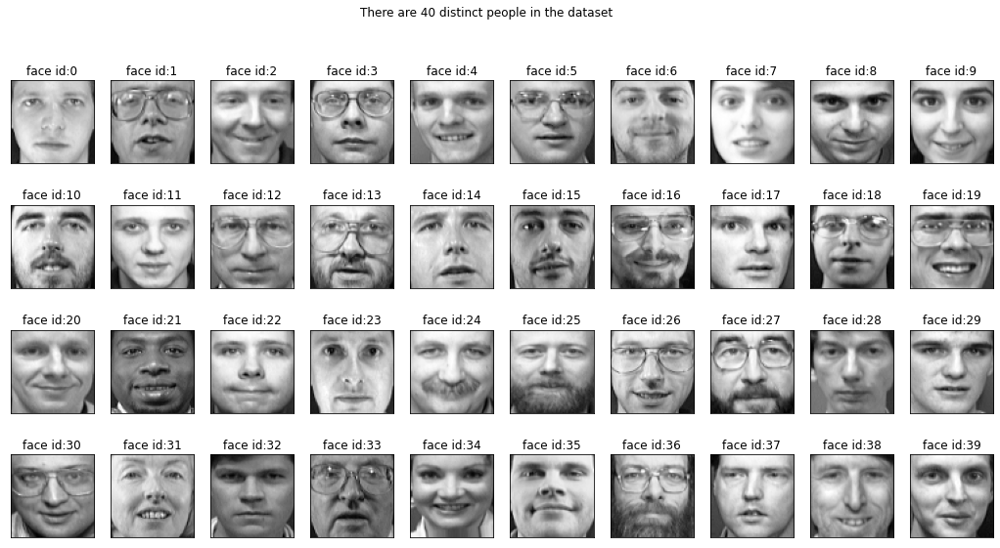

In [25]:
def show_40_distinct_people(images, unique_ids):
    #Creating 4X10 subplots in  18x9 figure size
    fig, axarr=plt.subplots(nrows=4, ncols=10, figsize=(18, 9))
    #For easy iteration flattened 4X10 subplots matrix to 40 array
    axarr=axarr.flatten()
    
    #iterating over user ids
    for unique_id in unique_ids:
        image_index=unique_id*10
        axarr[unique_id].imshow(images[image_index], cmap='gray')
        axarr[unique_id].set_xticks([])
        axarr[unique_id].set_yticks([])
        axarr[unique_id].set_title("face id:{}".format(unique_id))
    plt.suptitle("There are 40 distinct people in the dataset")
    
show_40_distinct_people(data, np.unique(target))